In [8]:
import pickle
import matplotlib.pyplot as plt
from pathlib import Path 
from PIL import Image
from sklearn.metrics import roc_curve, auc, confusion_matrix
import seaborn as sns
import torch
import numpy as np

desc = "1_8_16_16_32_32_tcn_kernels_3D-CNN_TCN_16TSL_Model_shuffle_depth_True"
folds = [1,2,3,4,5,6,7,8,9,10]

In [ ]:
path = f"SavedResults/{desc}/Fold_{fold}"
with open(f'{path}/Fold_{1}_train_losses.pkl', 'rb') as f:
    train_classification_losses = pickle.load(f)

## 10 fold plots

In [ ]:
def rb_and_plot_10_fold_accuracies(fold, desc):
    path = f"SavedResults/{desc}/Fold_{fold}"

    with open(f'{path}/Fold_{fold}_kfold_validation_accuracies.pkl', 'rb') as f:
        kfold_validation_accuracies = pickle.load(f)

    with open(f'{path}/Fold_{fold}_train_accuracies.pkl', 'rb') as f:
        train_accuracies = pickle.load(f)

    with open(f'{path}/Fold_{fold}_validation_accuracies.pkl', 'rb') as f:
        validation_accuracies = pickle.load(f)
        
    #Plotting
    plt.figure(figsize=(50, 8), dpi=300)
    plt.plot(train_accuracies, linewidth=4.5)
    plt.plot(validation_accuracies, linewidth=4.5)
    for fold_accuracies in kfold_validation_accuracies:
        plt.plot(fold_accuracies, linewidth=3)

    plt.grid(True)
    #plt.plot(test_accuracies)
    plt.rcParams['font.size'] = 14
    #plt.rcParams['lines.linewidth'] = 2.5
    plt.title(f'{desc}_{fold}th_fold')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'val', 'fold1', 'fold2', 'fold3', 'fold4', 'fold5', 'fold6', 'fold7', 'fold8', 'fold9', 'fold10'], loc='upper left', fontsize='large')
    target_dir_path = Path(f"Output_Plots/{desc}/10_folds_accuracy_plot")
    target_dir_path.mkdir(parents=True, exist_ok=True)
    plt.savefig(f'{target_dir_path}/fold_{fold}', dpi=300, bbox_inches='tight')
    

In [6]:
def rb_and_plot_10_fold_classification_losses(fold, desc):
    path = f"SavedResults/{desc}/Fold_{fold}"

    with open(f'{path}/Fold_{fold}_kfold_validation_losses.pkl', 'rb') as f:
        kfold_validation_classification_losses = pickle.load(f)

    with open(f'{path}/Fold_{fold}_train_losses.pkl', 'rb') as f:
        train_classification_losses = pickle.load(f)

    with open(f'{path}/Fold_{fold}_validation_losses.pkl', 'rb') as f:
        validation_classification_losses = pickle.load(f)

    #Plotting
    plt.figure(figsize=(50, 8), dpi=300)
    plt.plot(train_classification_losses, linewidth=4.5)
    plt.plot(validation_classification_losses, linewidth=4.5)
    for fold_losses in kfold_validation_classification_losses:
        plt.plot(fold_losses, linewidth=3)

    plt.grid(True)
    #plt.plot(test_accuracies)
    plt.rcParams['font.size'] = 14
    #plt.rcParams['lines.linewidth'] = 2.5
    plt.title(f'{desc}_{fold}th_fold')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val', 'fold1', 'fold2', 'fold3', 'fold4', 'fold5', 'fold6', 'fold7', 'fold8', 'fold9', 'fold10'], loc='upper left', fontsize='large')
    target_dir_path = Path(f"Output_Plots/{desc}/10_folds_class_loss_plot")
    target_dir_path.mkdir(parents=True, exist_ok=True)
    plt.savefig(f'{target_dir_path}/fold_{fold}', dpi=300, bbox_inches='tight')


## Train-validation plots

In [2]:
def rb_and_plot_train_validation_accuracies(fold, desc):
    path = f"SavedResults/{desc}/Fold_{fold}"

    with open(f'{path}/Fold_{fold}_train_accuracies.pkl', 'rb') as f:
        train_accuracies = pickle.load(f)

    with open(f'{path}/Fold_{fold}_validation_accuracies.pkl', 'rb') as f:
        validation_accuracies = pickle.load(f)
        
    #Plotting
    plt.figure(figsize=(15, 8), dpi=300)
    plt.plot(train_accuracies, linewidth=2.5)
    plt.plot(validation_accuracies, linewidth=2.5)
    
    plt.grid(True)
    plt.rcParams['font.size'] = 14
    plt.rcParams['lines.linewidth'] = 2
    plt.title(f'{desc}_{fold}th_fold')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'val', 'training'], loc='upper left', fontsize='large')
    target_dir_path = Path(f"Output_Plots/{desc}/train_val_accuracy_plot")
    target_dir_path.mkdir(parents=True, exist_ok=True)
    plt.savefig(f'{target_dir_path}/fold_{fold}', dpi=300, bbox_inches='tight')

In [3]:
def rb_and_plot_train_validation_losses(fold, desc):
    path = f"SavedResults/{desc}/Fold_{fold}"

    with open(f'{path}/Fold_{fold}_train_losses.pkl', 'rb') as f:
        train_classification_losses = pickle.load(f)
        
    for i in range(len(train_classification_losses)):
        train_classification_losses[i] = train_classification_losses[i].item()
        
    with open(f'{path}/Fold_{fold}_validation_losses.pkl', 'rb') as f:
        validation_classification_losses = pickle.load(f)
        
    #Plotting
    plt.figure(figsize=(15, 8), dpi=300)
    plt.plot(train_classification_losses, linewidth=2.5)
    plt.plot(validation_classification_losses, linewidth=2.5)
    
    plt.grid(True)
    plt.rcParams['font.size'] = 14
    plt.rcParams['lines.linewidth'] = 2
    plt.title(f'{desc}_{fold}th_fold')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'val', 'training'], loc='upper left', fontsize='large')
    target_dir_path = Path(f"Output_Plots/{desc}/train_val_class_loss_plot")
    target_dir_path.mkdir(parents=True, exist_ok=True)
    plt.savefig(f'{target_dir_path}/fold_{fold}', dpi=300, bbox_inches='tight')

In [4]:
def print_metrics(fold, desc, epoch):
    path = f"SavedResults/{desc}/Fold_{fold}"
    
    with open(f'{path}/Fold_{fold}_validation_y.pkl', 'rb') as f:
        validation_y = pickle.load(f)
        
    y, y_val_pred = validation_y[epoch]['y'], validation_y[epoch]['y_val_pred']
    y_pred_binary = (y_val_pred>0.5).type(torch.float32)
        
    y_true = y.cpu().numpy()
    y_pred = y_val_pred.cpu().numpy()
    y_binary_pred = y_pred_binary.cpu().numpy()

    fpr, tpr, thresholds = roc_curve(y_true, y_pred)

    TP = ((y == 1) & (y_pred_binary == 1)).sum().item()
    FN = ((y == 1) & (y_pred_binary == 0)).sum().item()
    TN = ((y == 0) & (y_pred_binary == 0)).sum().item()
    FP = ((y == 0) & (y_pred_binary == 1)).sum().item()
    
    accuracy = (TP+TN)/(TP+TN+FP+FN)
    precision = TP/(TP+FP)
    recall = TP/(TP+FN)
    specificity = TN/(TN+FP)
    f1_score = 2 * (precision*recall)/(precision+recall)
    
    roc_auc_pos = auc(fpr, tpr)
    
    fnr = 1 - tpr
    tnr = 1 - fpr
    
    roc_auc_neg = auc(fnr, tnr)
    
    cm = confusion_matrix(y_true, y_binary_pred)
    cm_normalized = cm/np.sum(cm)
    
    print(f"Accuracy: {accuracy*100:.2f}%")
    print(f"Precision: {precision*100:.2f}%")
    print(f"Sensitivity (Recall): {recall*100:.2f}%")
    print(f"specificity: {specificity*100:.2f}%")
    print(f"F1_score: {f1_score*100:.2f}%")
    print(f"Area under curve: {roc_auc_pos:.5f}")
    
    #Plotting
    plt.figure(figsize=(10, 7), dpi=300)
    plt.plot(fpr, tpr, color="green", lw=2, label=f"ROC curve (area = {roc_auc_pos:.3f})")
    plt.plot(fnr, tnr, color="darkorange", lw=2, label=f"ROC curve (area = {roc_auc_neg:.3f})")
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.grid(True)
    plt.rcParams['font.size'] = 14
    plt.rcParams['lines.linewidth'] = 2
    plt.title(f'{fold}th_fold_Receiver Operating Characteristic (ROC) curve')
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.legend(loc='lower right', fontsize='large')
    target_dir_path = Path(f"Output_Plots/{desc}/roc_curve")
    target_dir_path.mkdir(parents=True, exist_ok=True)
    plt.savefig(f'{target_dir_path}/fold_{fold}', dpi=300, bbox_inches='tight')
    
    #Confusion Matrix
    plt.figure(figsize=(8,8))
    sns.heatmap(cm_normalized, annot=True, fmt='g', cmap='Blues')
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(f'{fold}th_fold_Confusion Matrix')
    target_dir_path = Path(f"Output_Plots/{desc}/confusion_matrix")
    target_dir_path.mkdir(parents=True, exist_ok=True)
    plt.savefig(f'{target_dir_path}/fold_{fold}', dpi=300, bbox_inches='tight')
    #plt.show()
    
    return cm_normalized

In [5]:
def print_accuracies(desc, fold):
    path = f"SavedResults/{desc}/Fold_{fold}"
    
    with open(f'{path}/Fold_{fold}_validation_y.pkl', 'rb') as f:
        validation_y = pickle.load(f)
    for epoch in range(len(validation_y)):
        y, y_val_pred = validation_y[epoch]['y'], validation_y[epoch]['y_val_pred']
        y_pred_binary = (y_val_pred>0.5).type(torch.float32)
            
        y_true = y.cpu().numpy()
        y_pred = y_val_pred.cpu().numpy()
        y_binary_pred = y_pred_binary.cpu().numpy()
    
        fpr, tpr, thresholds = roc_curve(y_true, y_pred)
    
        TP = ((y == 1) & (y_pred_binary == 1)).sum().item()
        FN = ((y == 1) & (y_pred_binary == 0)).sum().item()
        TN = ((y == 0) & (y_pred_binary == 0)).sum().item()
        FP = ((y == 0) & (y_pred_binary == 1)).sum().item()
        
        accuracy = (TP+TN)/(TP+TN+FP+FN)
        print(f"Epoch {epoch}: Accuracy: {accuracy*100:.2f}%")

# Execution

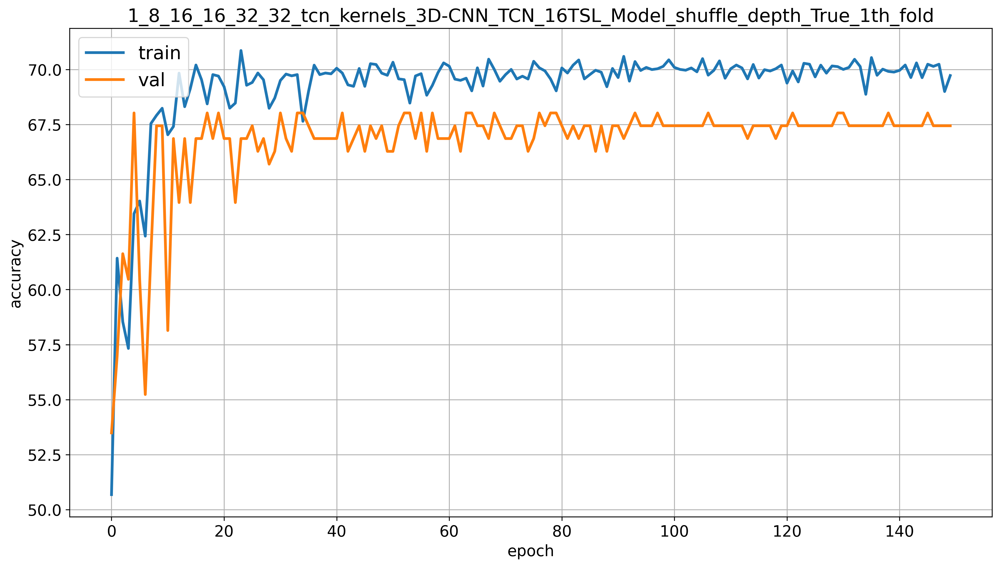

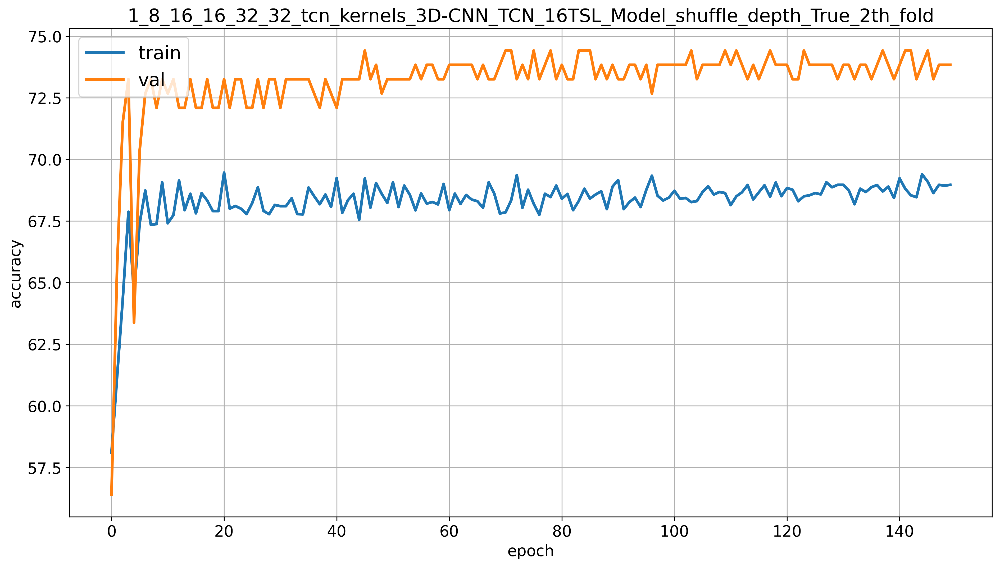

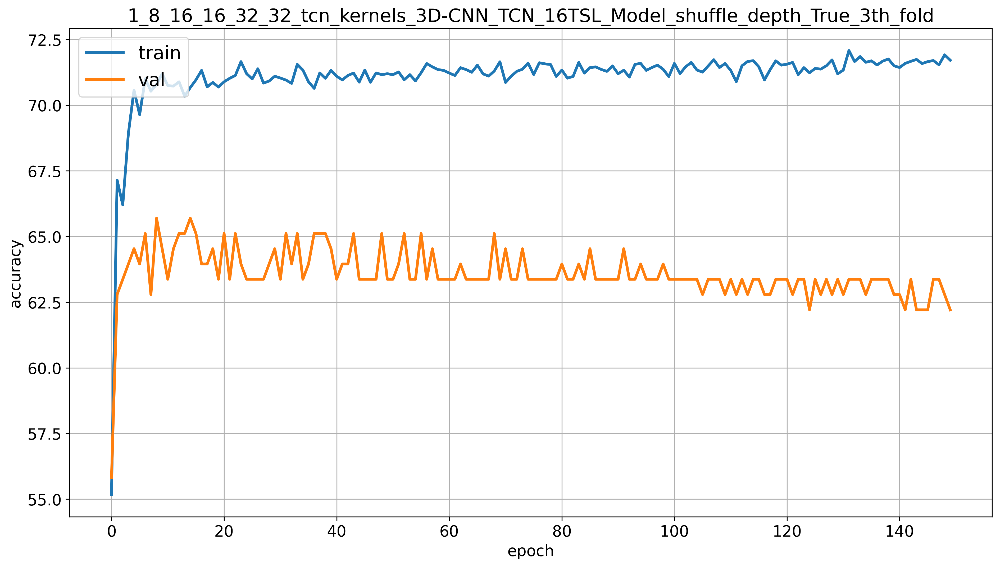

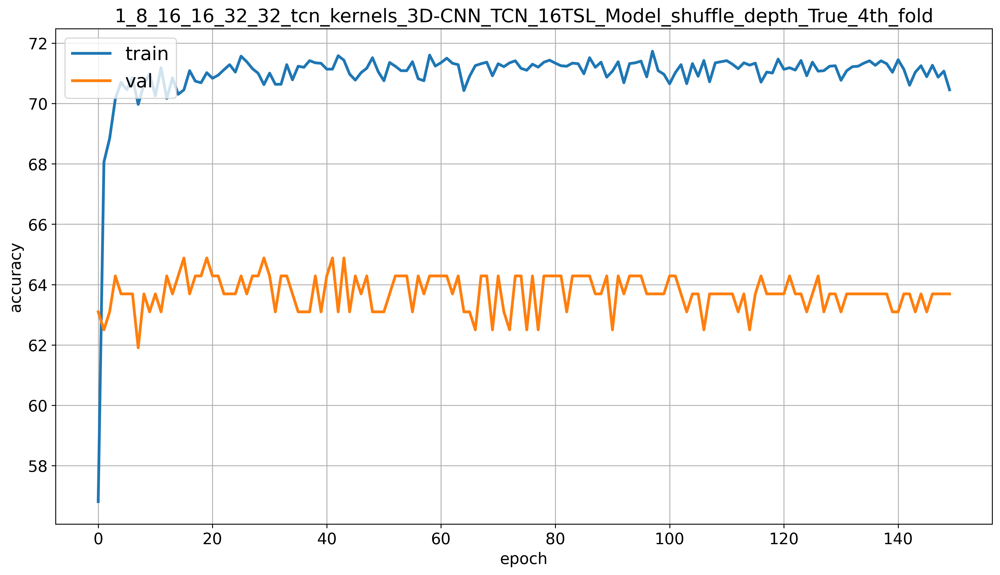

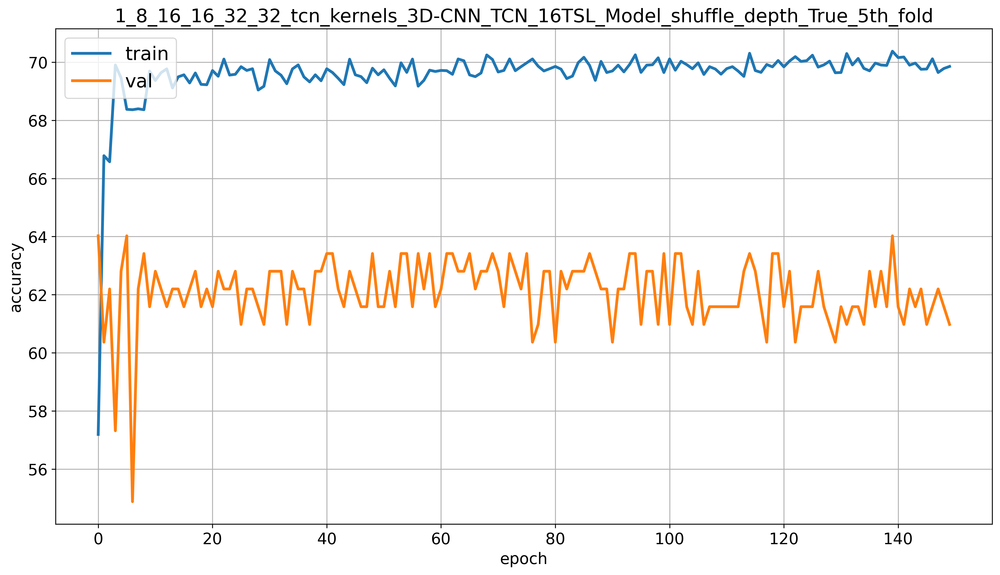

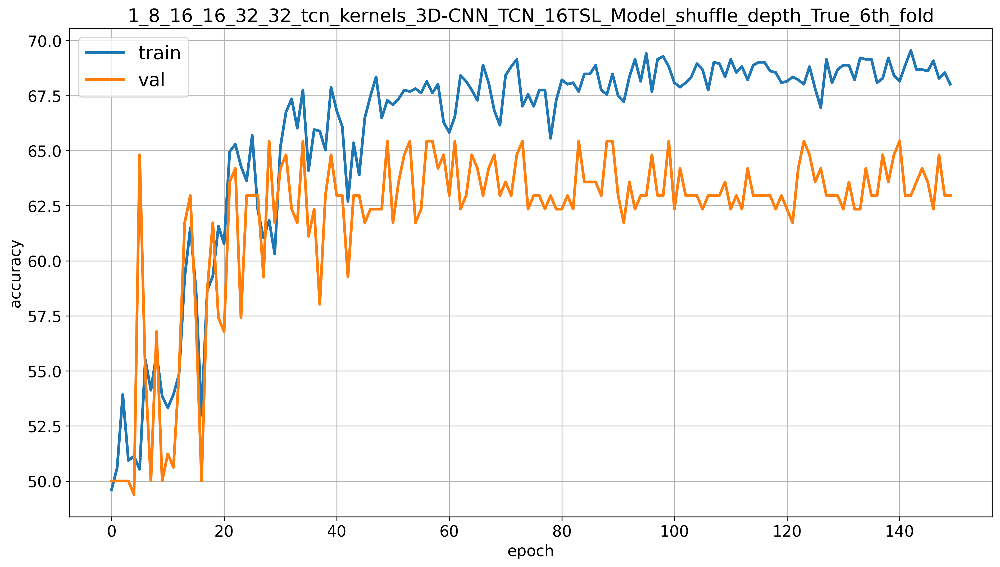

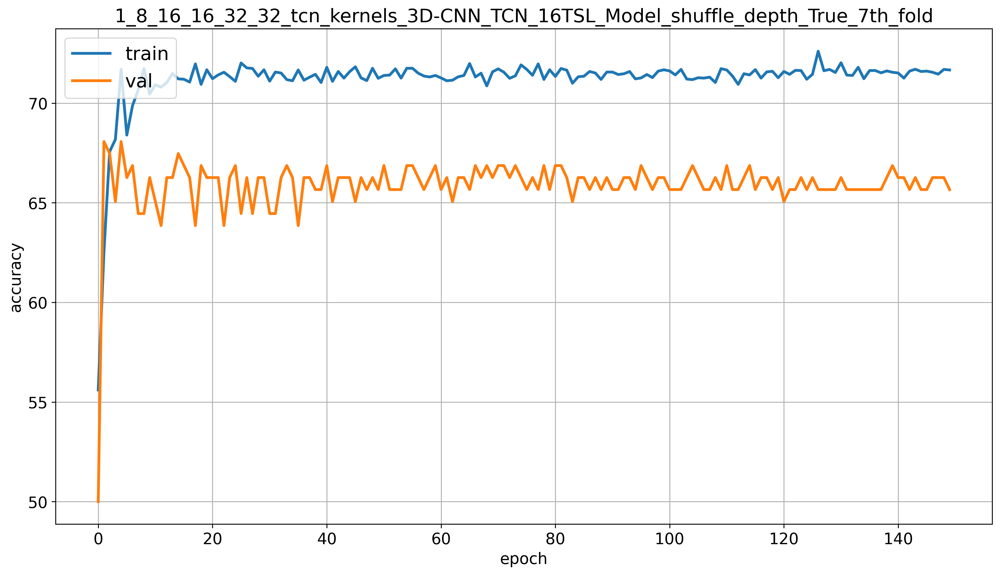

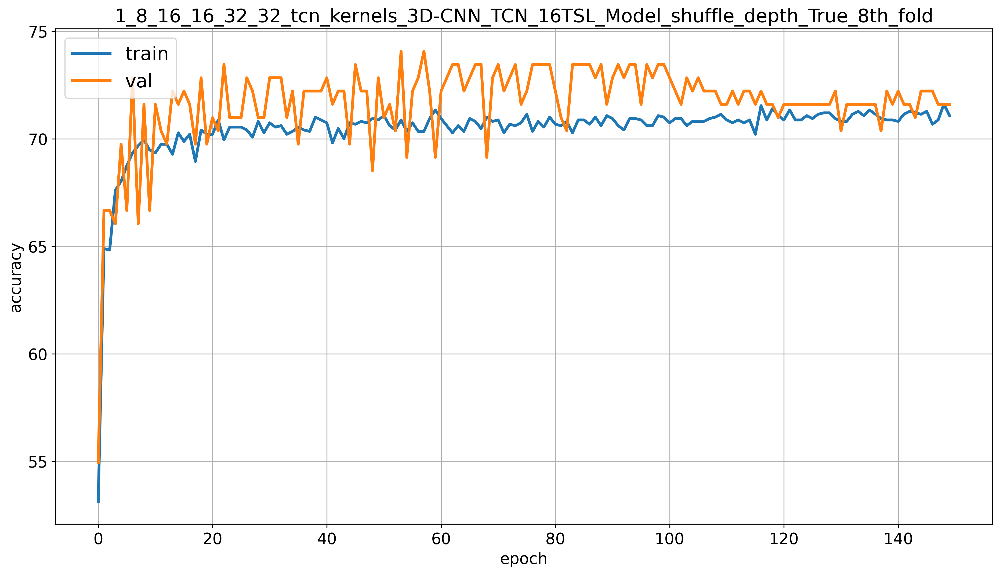

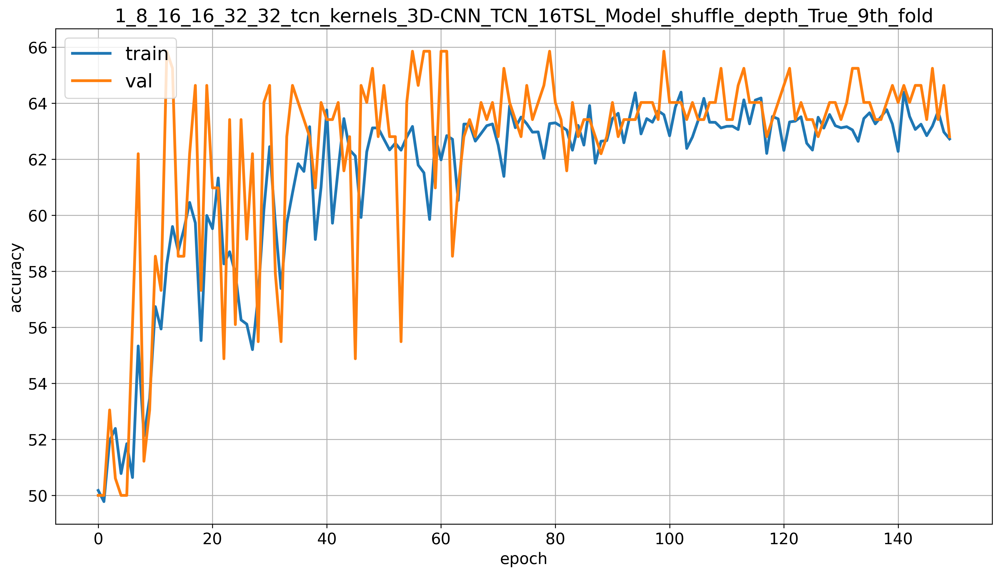

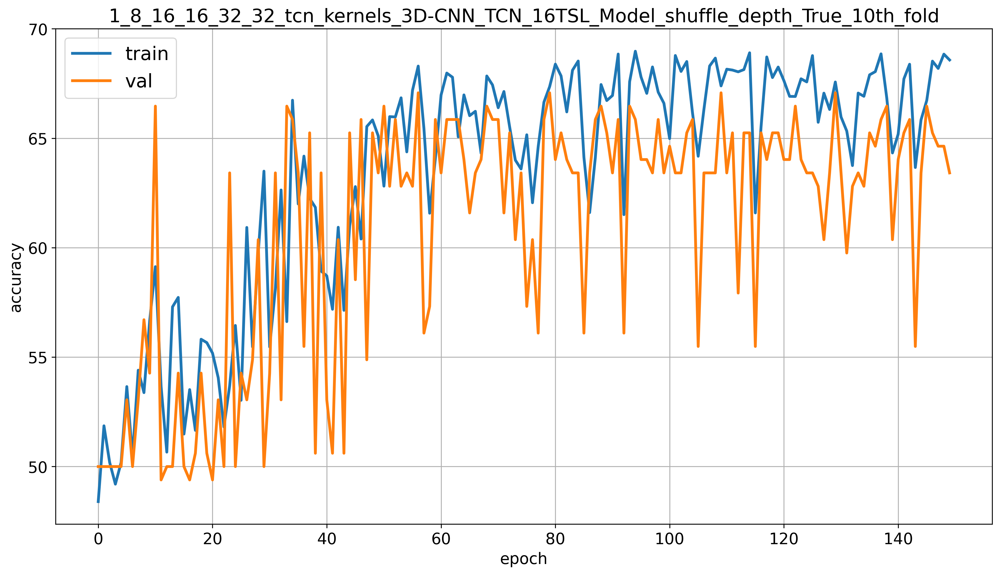

In [29]:
for fold in folds:
    rb_and_plot_train_validation_accuracies(fold,desc)

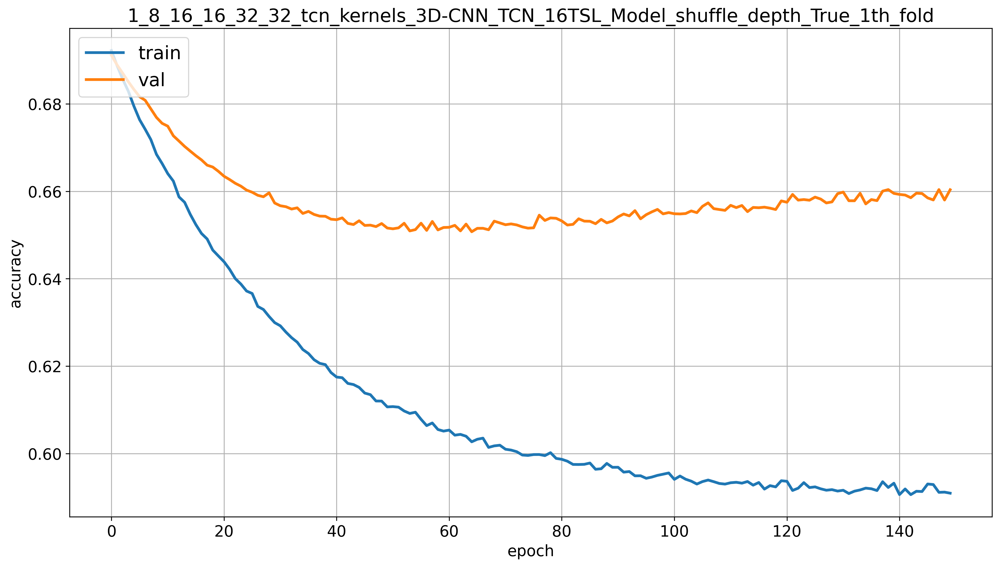

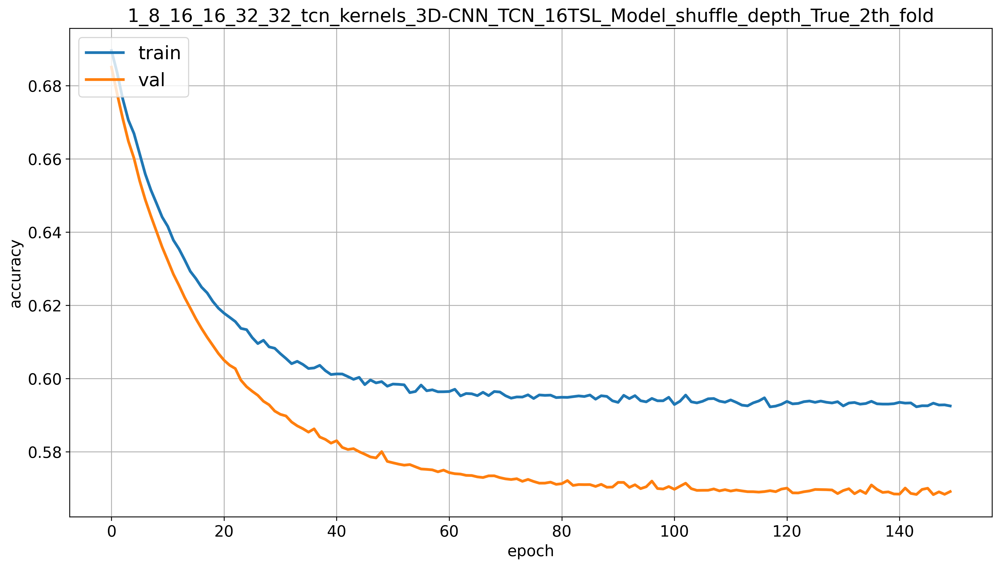

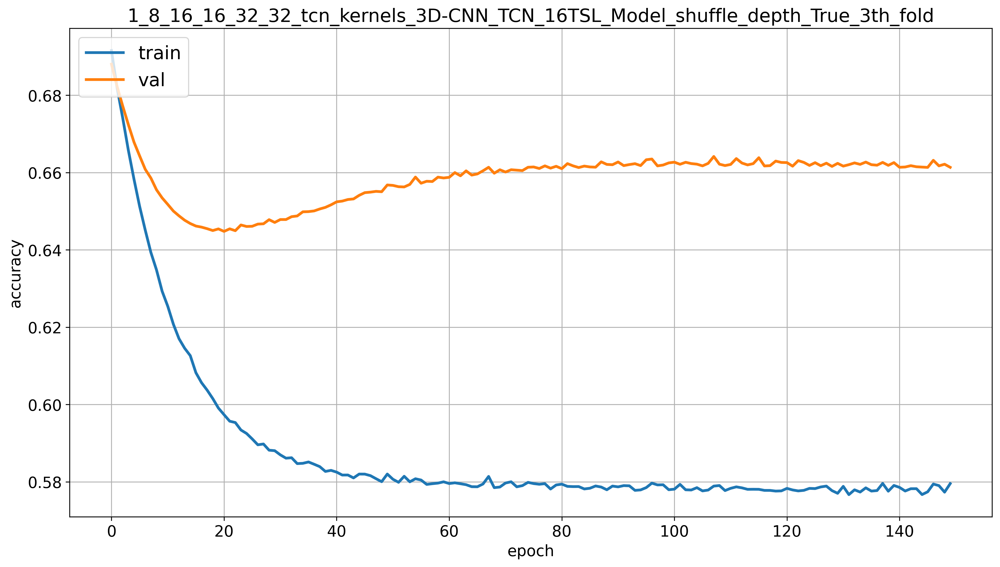

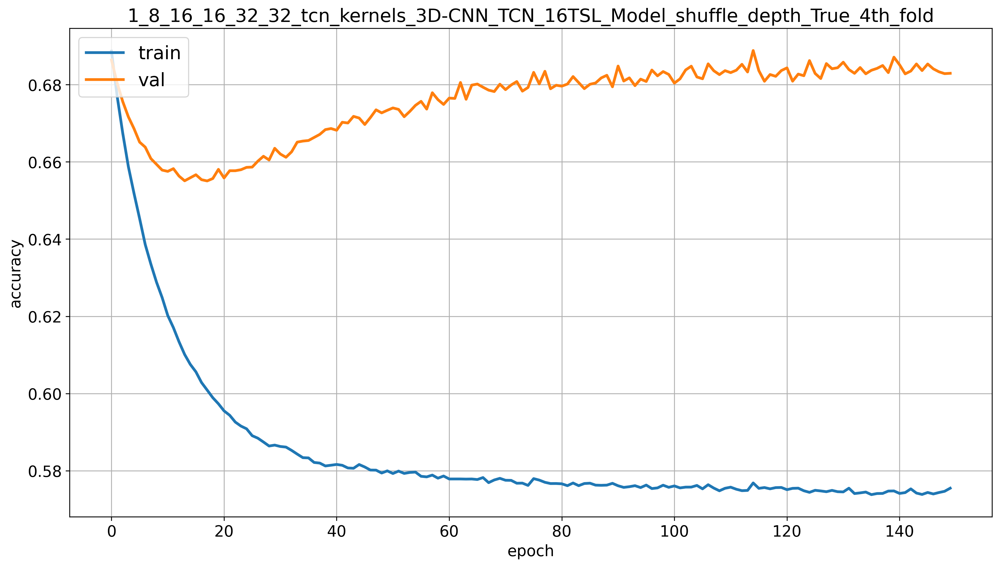

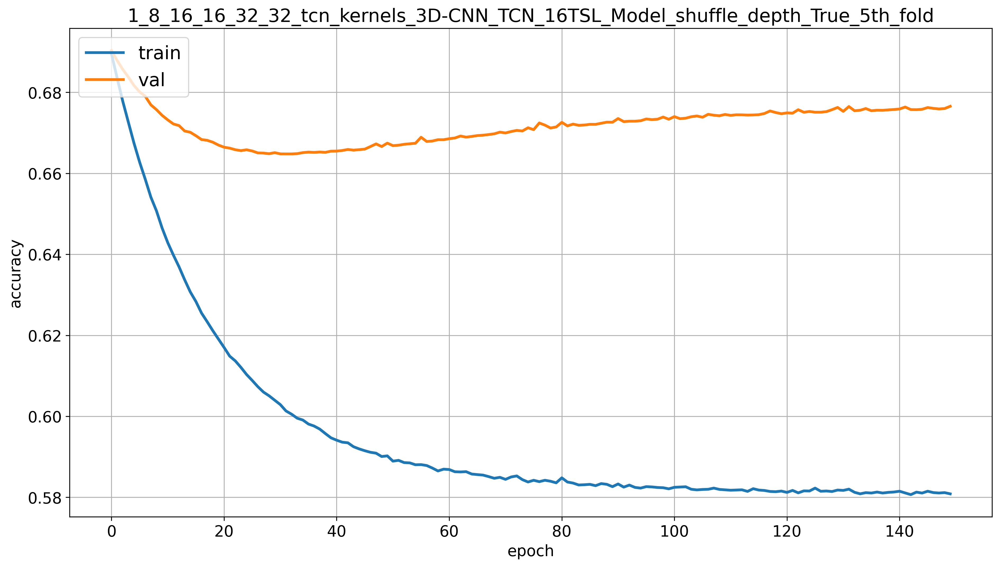

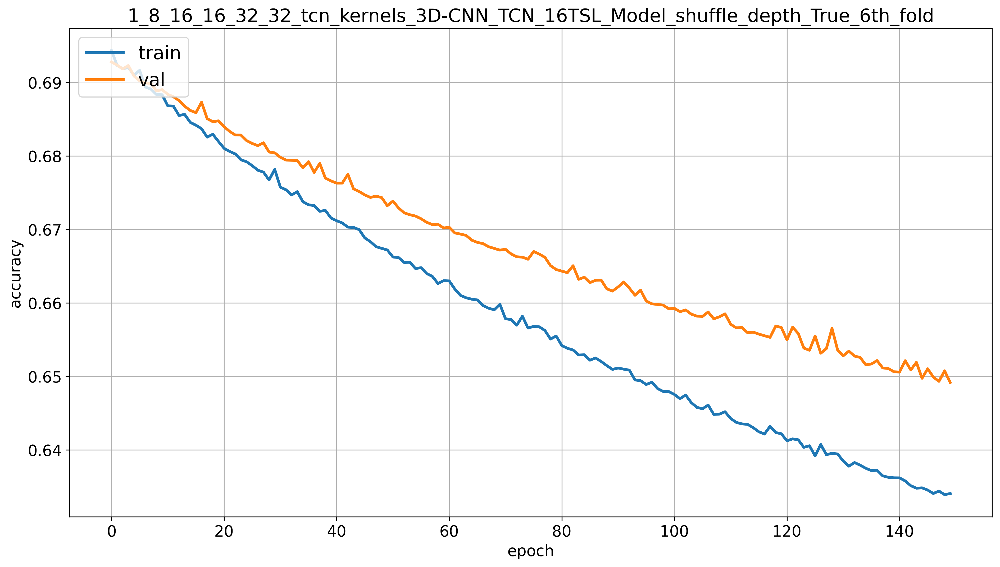

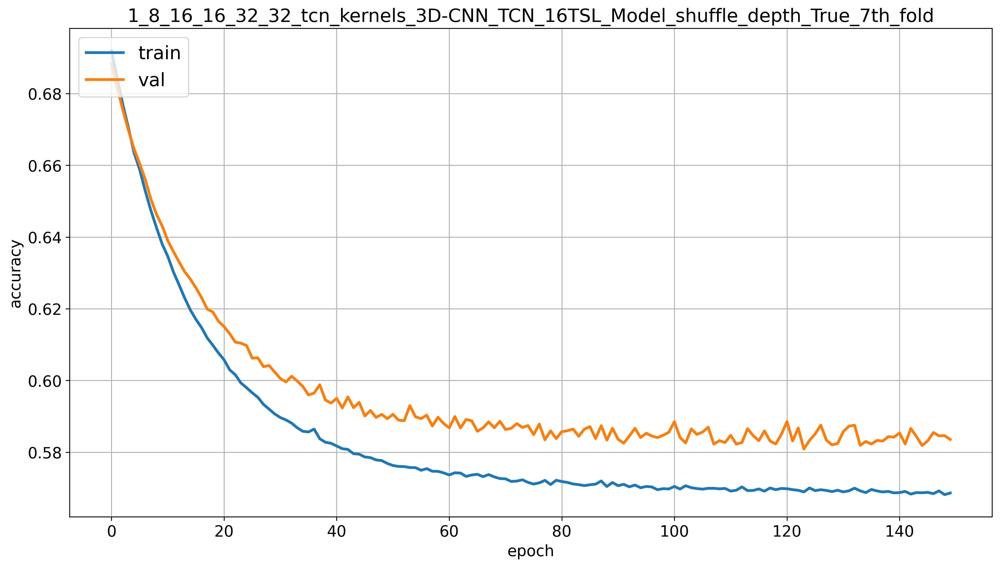

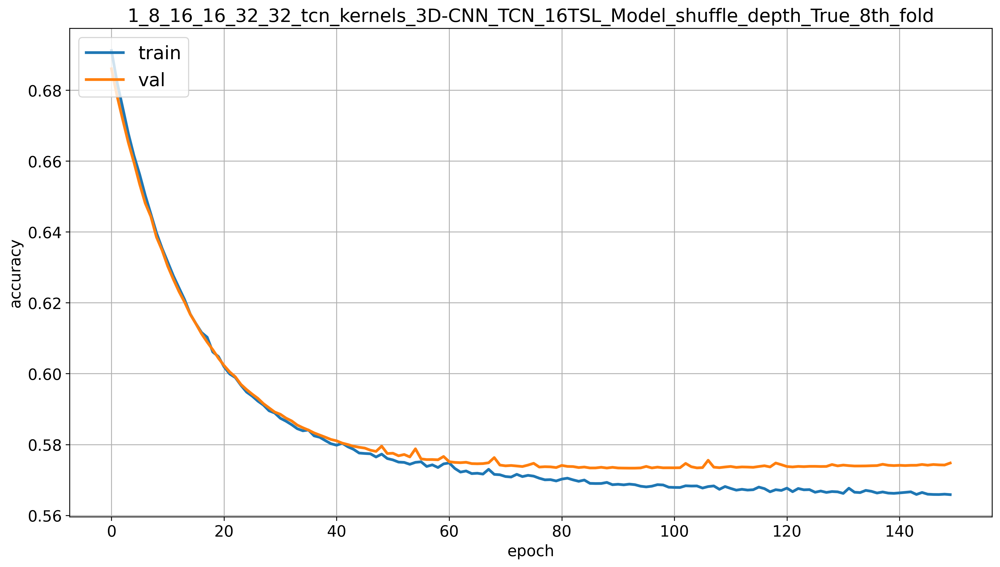

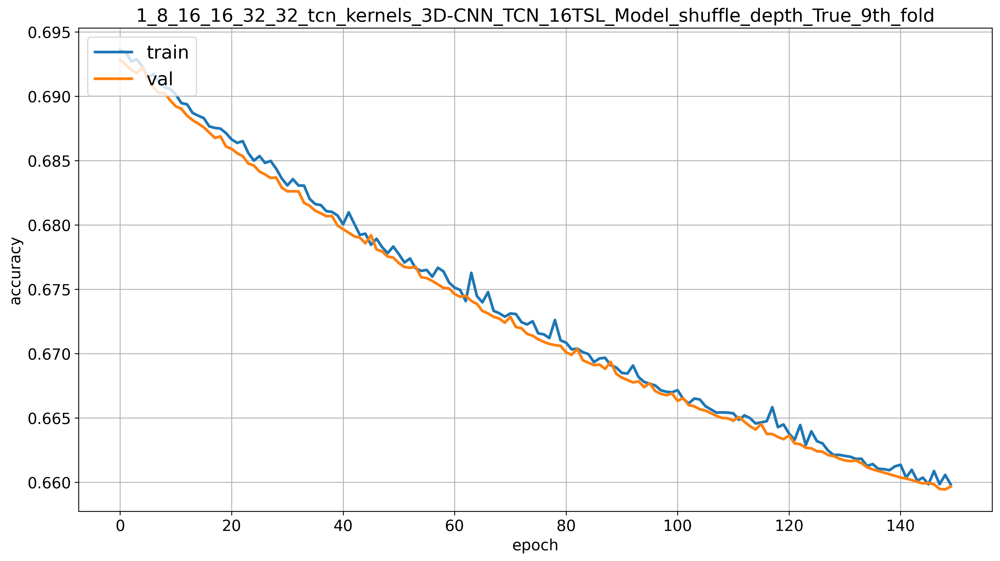

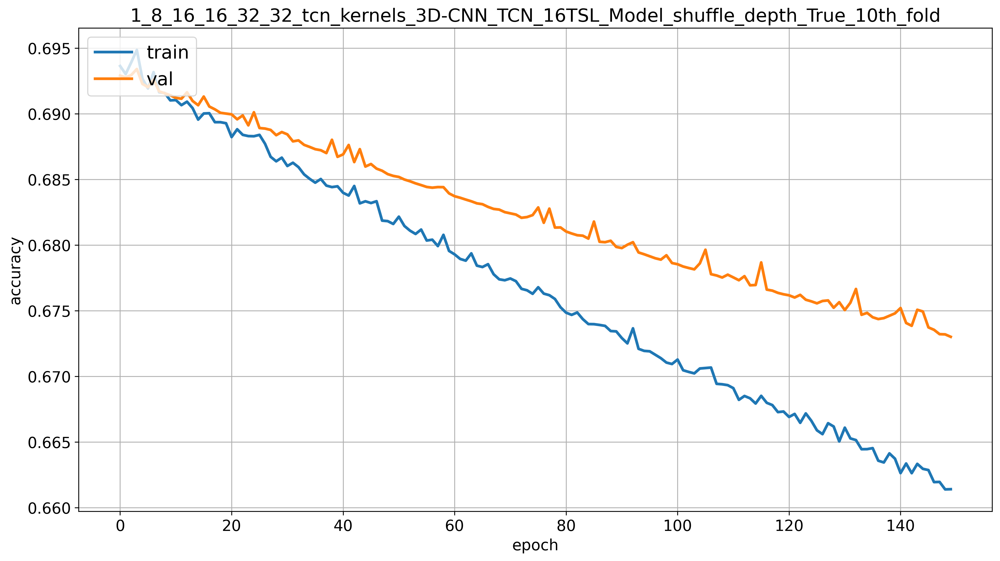

In [30]:
for fold in folds:
    rb_and_plot_train_validation_losses(fold,desc)

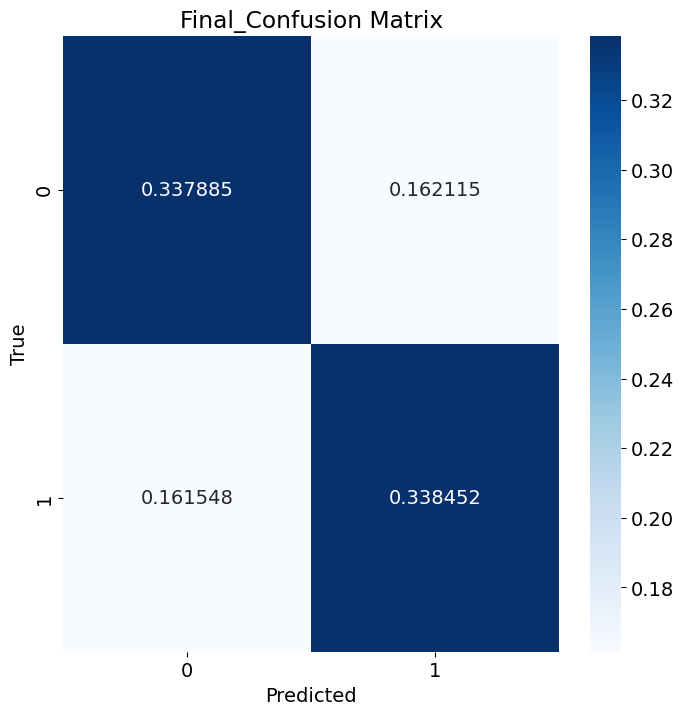

In [25]:
confusion_matrix_accumulator = cm1 + cm2 + cm3 + cm4 + cm5 + cm6 + cm7 + cm8 + cm9 + cm10
confusion_matrix_accumulator /= 10

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix_accumulator, annot=True, fmt='g', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title(f'Final_Confusion Matrix')
target_dir_path = Path(f"Output_Plots/{desc}/confusion_matrix")
target_dir_path.mkdir(parents=True, exist_ok=True)
plt.savefig(f'{target_dir_path}/average', dpi=300, bbox_inches='tight')

Accuracy: 65.70%
Precision: 69.57%
Sensitivity (Recall): 55.81%
specificity: 75.58%
F1_score: 61.94%
Area under curve: 0.68158
Accuracy: 69.77%
Precision: 68.89%
Sensitivity (Recall): 72.09%
specificity: 67.44%
F1_score: 70.45%
Area under curve: 0.76595
Accuracy: 63.95%
Precision: 63.04%
Sensitivity (Recall): 67.44%
specificity: 60.47%
F1_score: 65.17%
Area under curve: 0.68118
Accuracy: 63.10%
Precision: 61.22%
Sensitivity (Recall): 71.43%
specificity: 54.76%
F1_score: 65.93%
Area under curve: 0.66582
Accuracy: 60.98%
Precision: 61.54%
Sensitivity (Recall): 58.54%
specificity: 63.41%
F1_score: 60.00%
Area under curve: 0.63147
Accuracy: 67.28%
Precision: 64.58%
Sensitivity (Recall): 76.54%
specificity: 58.02%
F1_score: 70.06%
Area under curve: 0.72809
Accuracy: 67.47%
Precision: 68.83%
Sensitivity (Recall): 63.86%
specificity: 71.08%
F1_score: 66.25%
Area under curve: 0.75744
Accuracy: 73.46%
Precision: 73.17%
Sensitivity (Recall): 74.07%
specificity: 72.84%
F1_score: 73.62%
Area under

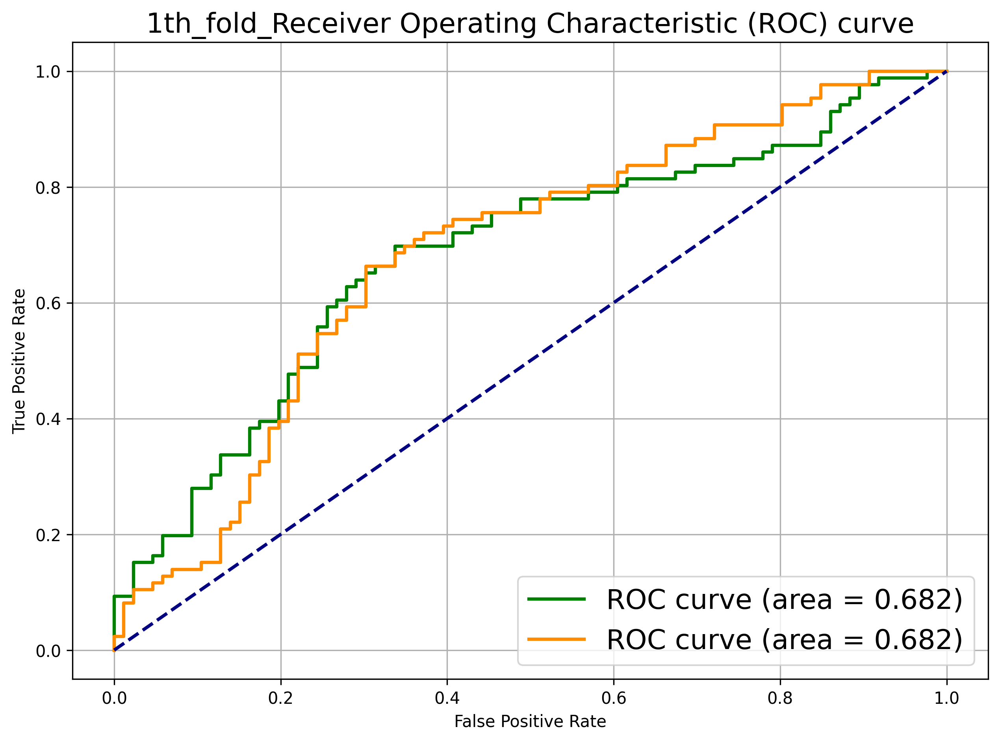

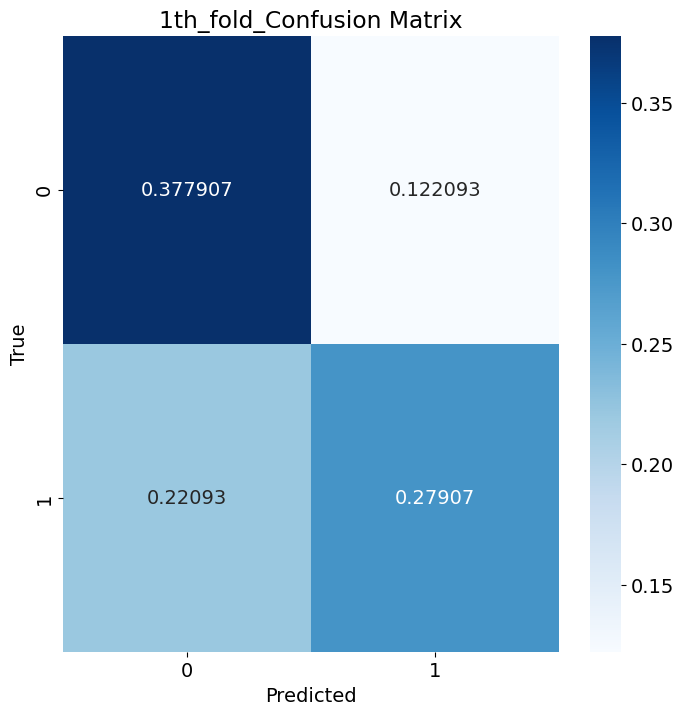

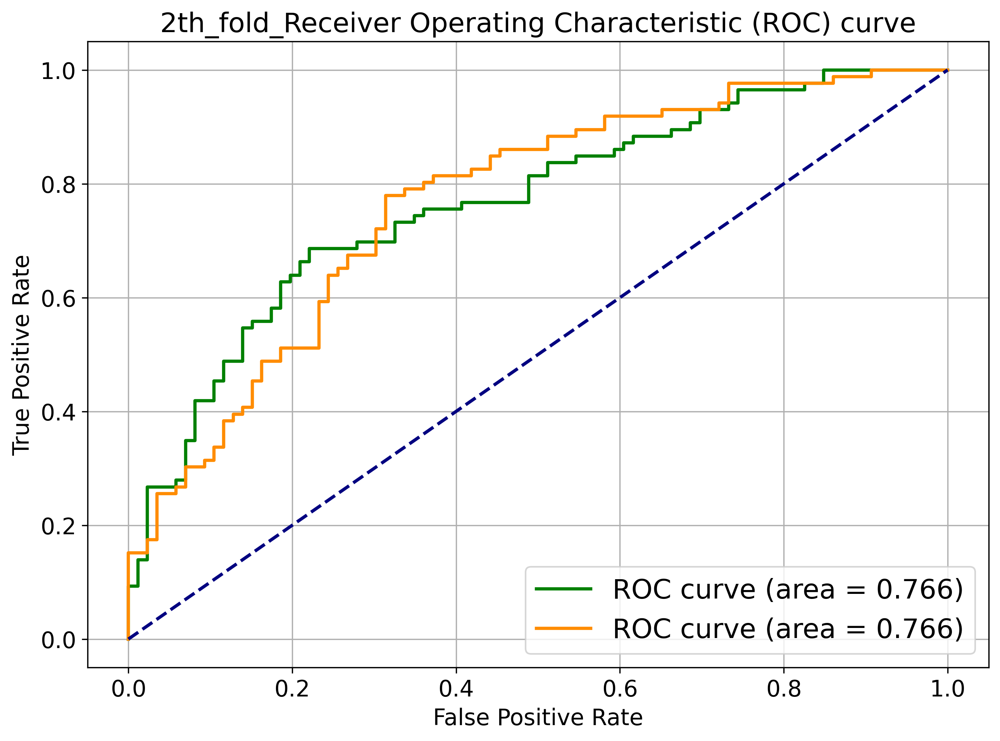

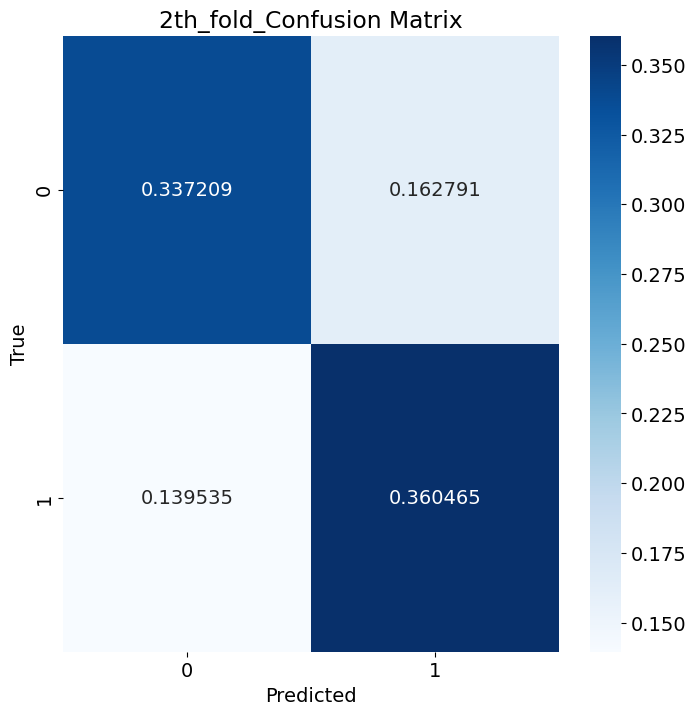

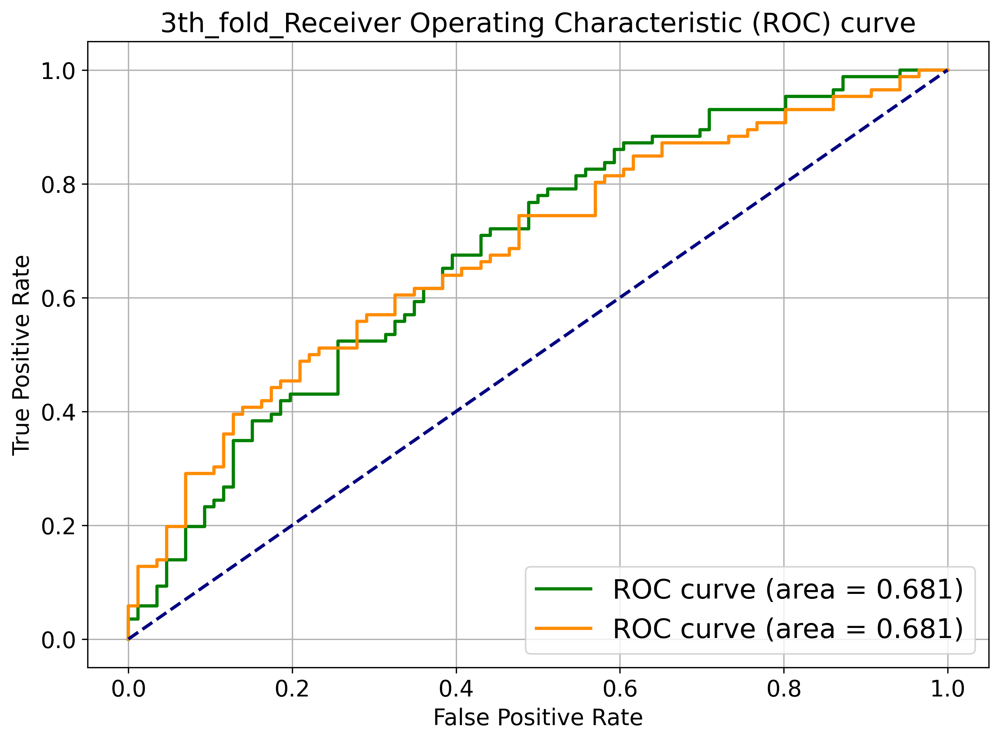

...

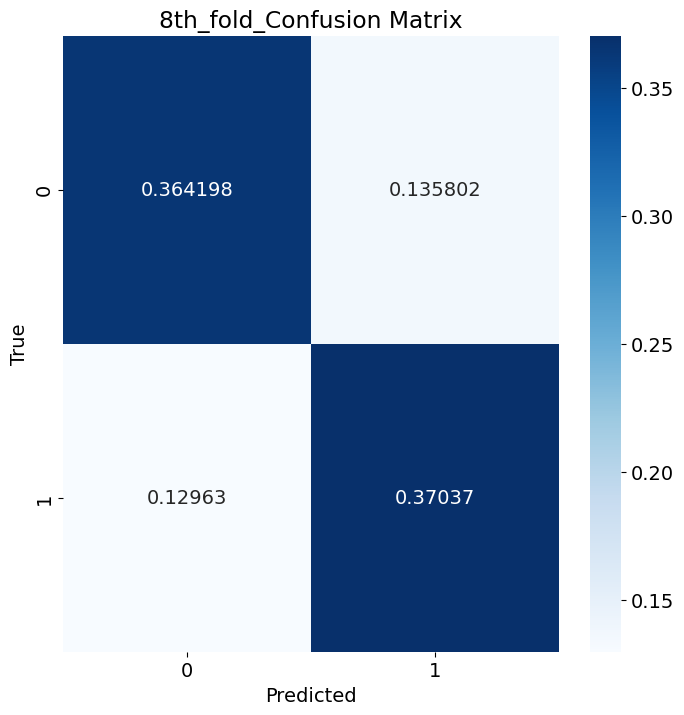

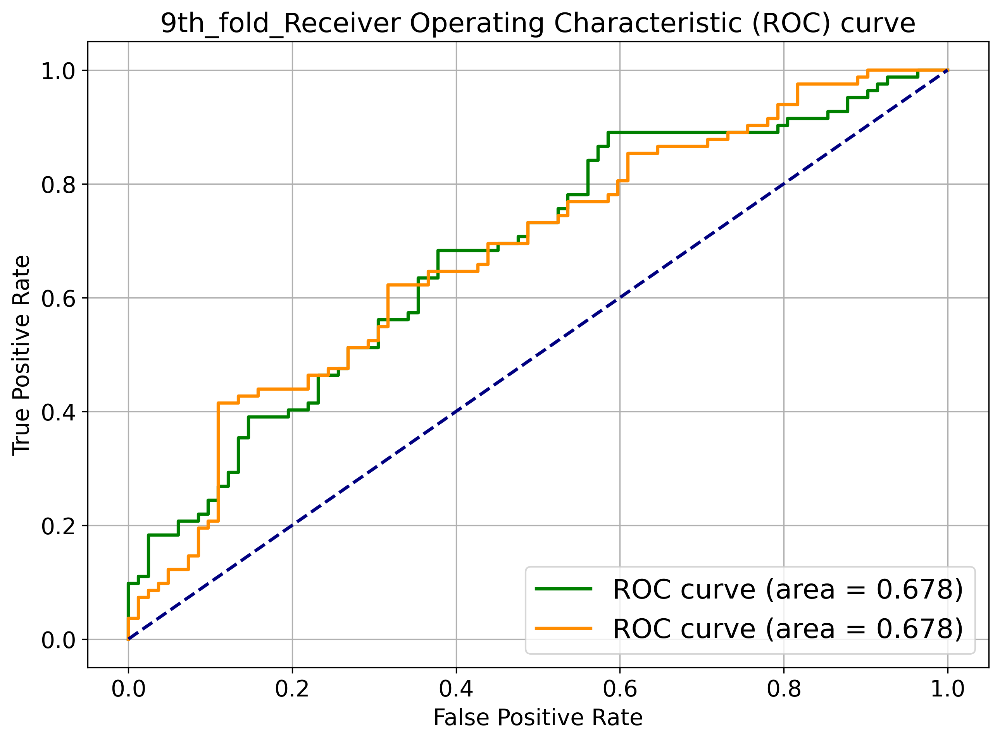

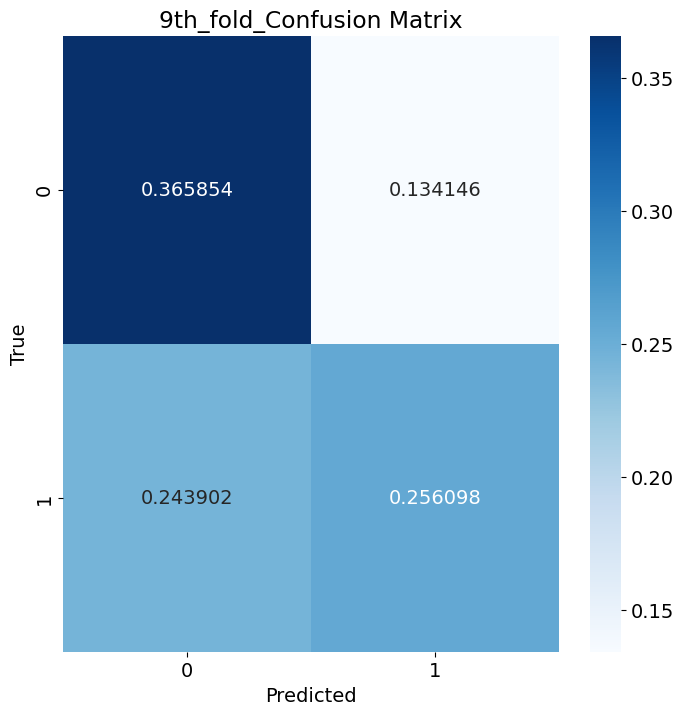

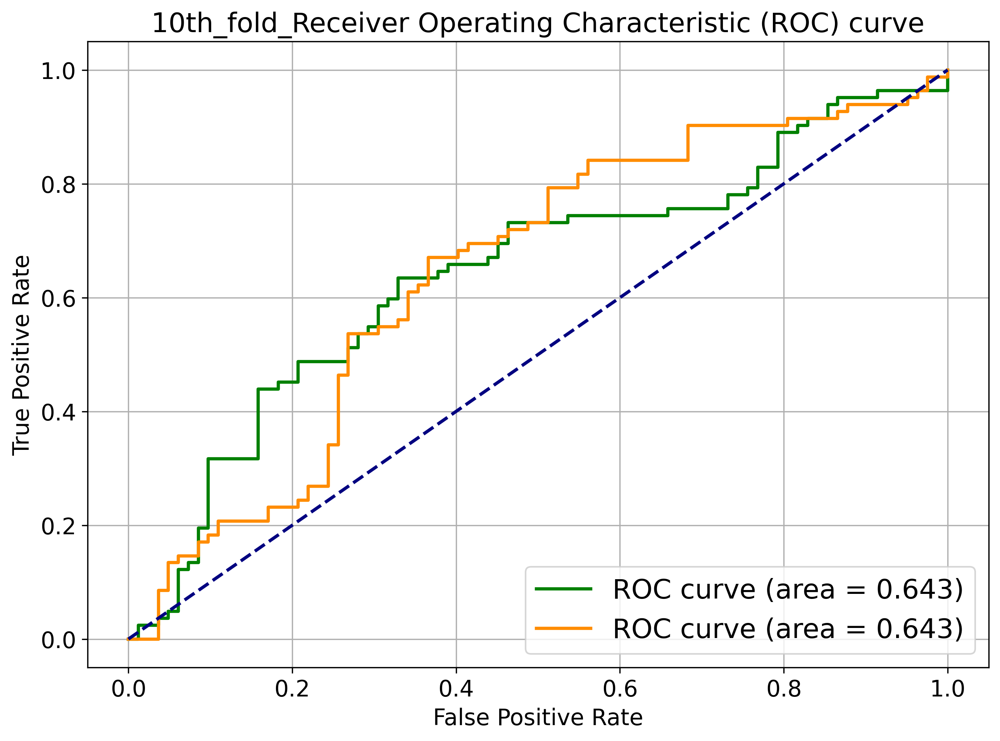

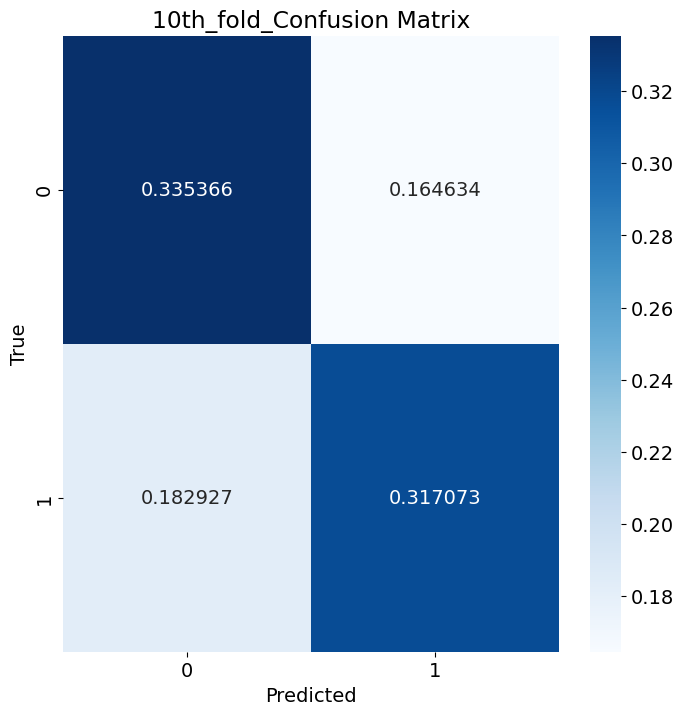

In [7]:
# Below results are for the main TCN model

confusion_matrix_accumulator = np.zeros((2, 2))
cm1 = print_metrics(1,desc,149)
cm2 = print_metrics(2,desc,149)
cm3 = print_metrics(3,desc,149)
cm4 = print_metrics(4,desc,149)
cm5 = print_metrics(5,desc,149)
cm6 = print_metrics(6,desc,149)
cm7 = print_metrics(7,desc,149)
cm8 = print_metrics(8,desc,149)
cm9 = print_metrics(9,desc,149)
cm10 = print_metrics(10,desc,149)

Accuracy: 67.44%
Precision: 70.27%
Sensitivity (Recall): 60.47%
specificity: 74.42%
F1_score: 65.00%
Area under curve: 0.67185
Accuracy: 73.84%
Precision: 74.70%
Sensitivity (Recall): 72.09%
specificity: 75.58%
F1_score: 73.37%
Area under curve: 0.77623
Accuracy: 62.21%
Precision: 61.54%
Sensitivity (Recall): 65.12%
specificity: 59.30%
F1_score: 63.28%
Area under curve: 0.68253
Accuracy: 63.69%
Precision: 62.37%
Sensitivity (Recall): 69.05%
specificity: 58.33%
F1_score: 65.54%
Area under curve: 0.65306
Accuracy: 60.98%
Precision: 61.84%
Sensitivity (Recall): 57.32%
specificity: 64.63%
F1_score: 59.49%
Area under curve: 0.64842
Accuracy: 62.96%
Precision: 61.29%
Sensitivity (Recall): 70.37%
specificity: 55.56%
F1_score: 65.52%
Area under curve: 0.70660
Accuracy: 65.66%
Precision: 67.57%
Sensitivity (Recall): 60.24%
specificity: 71.08%
F1_score: 63.69%
Area under curve: 0.75149
Accuracy: 71.60%
Precision: 71.60%
Sensitivity (Recall): 71.60%
specificity: 71.60%
F1_score: 71.60%
Area under

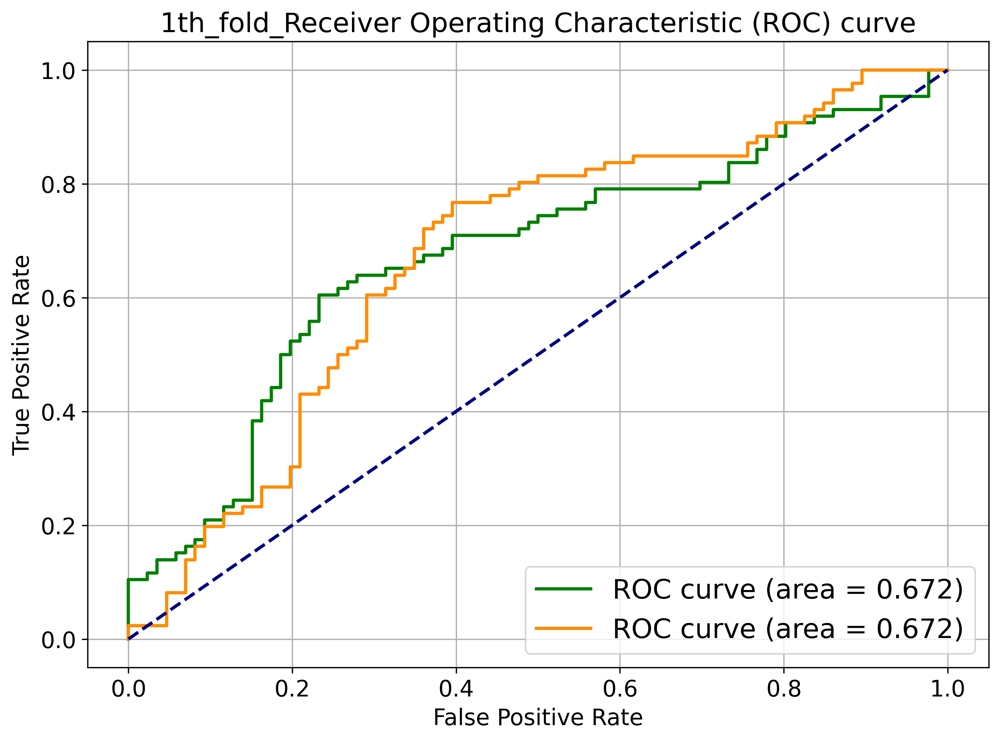

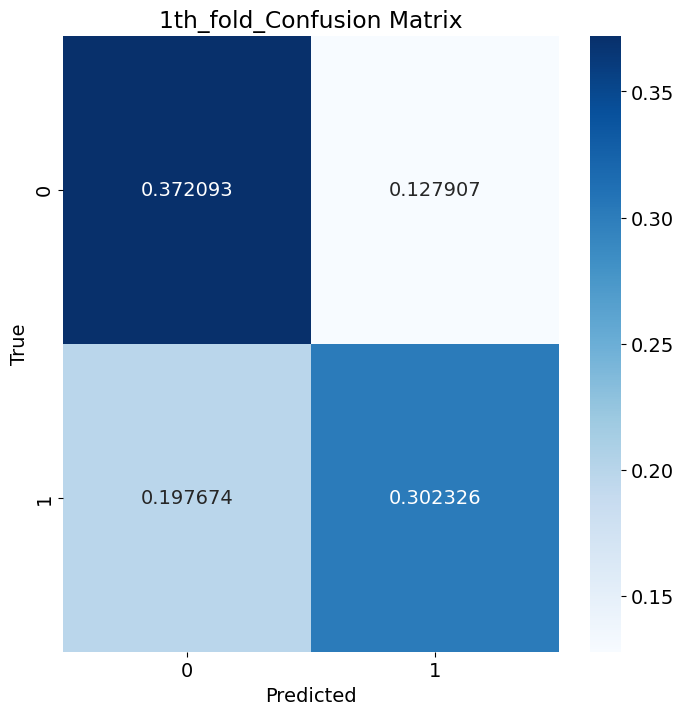

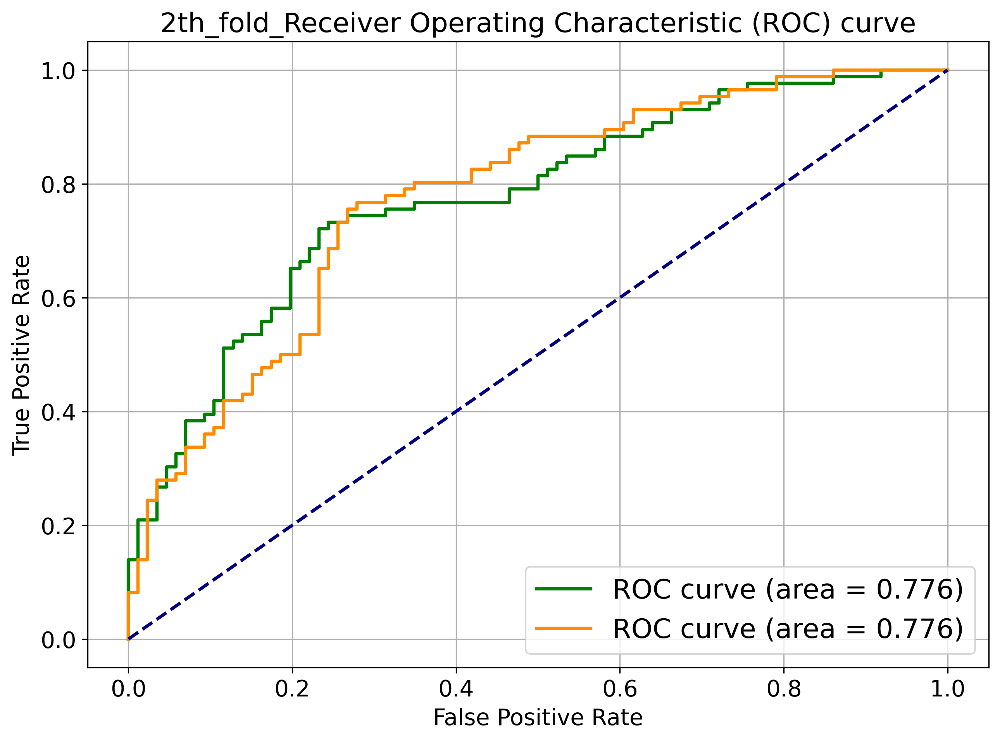

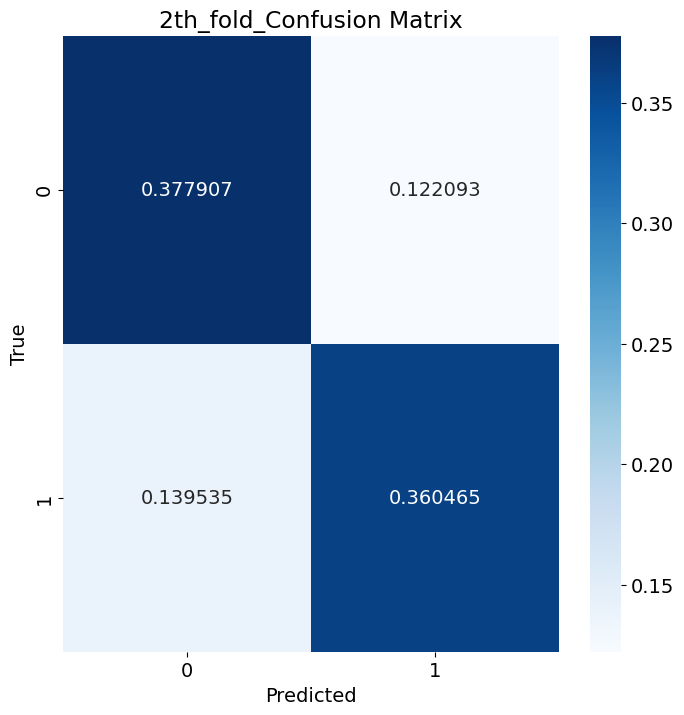

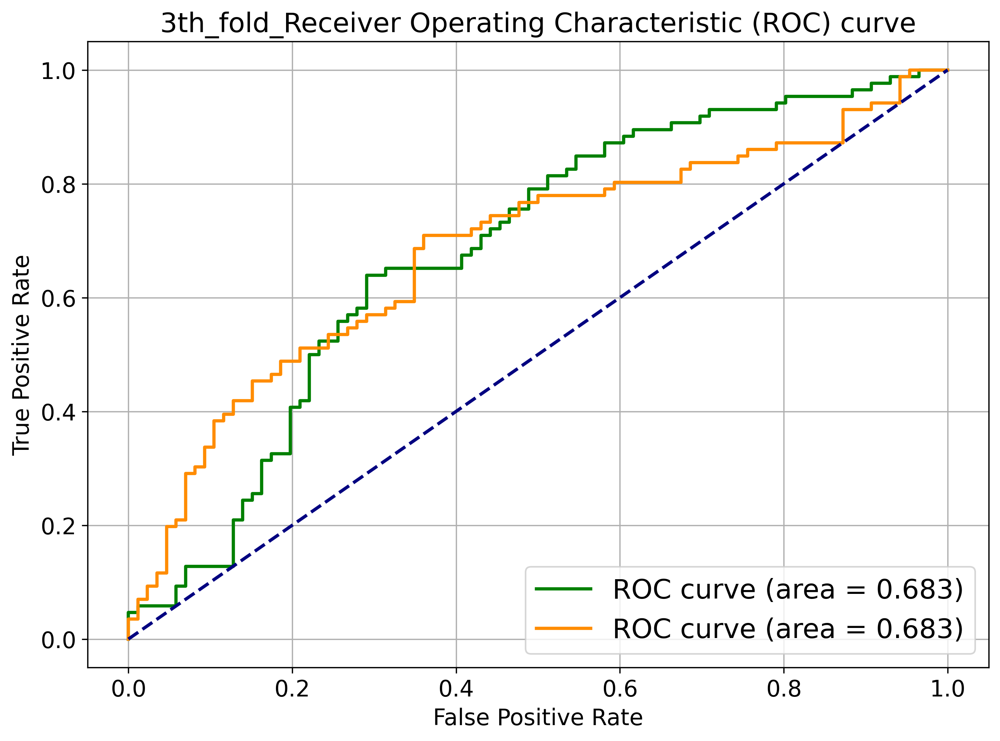

...

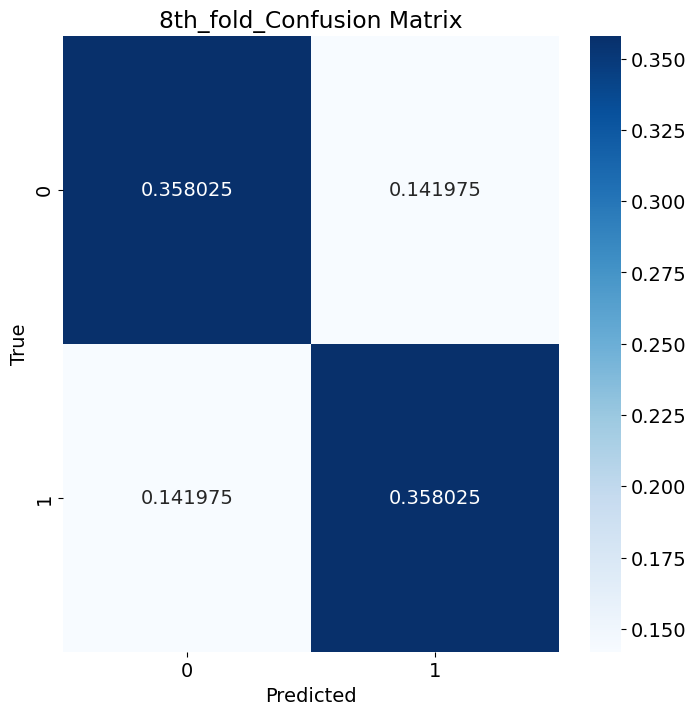

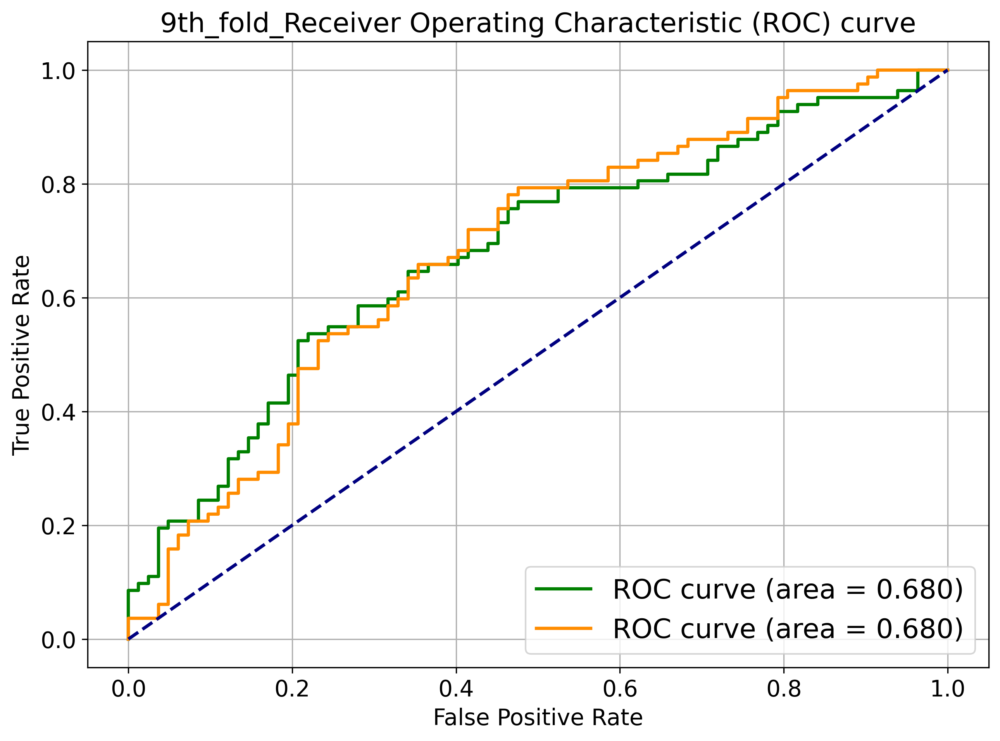

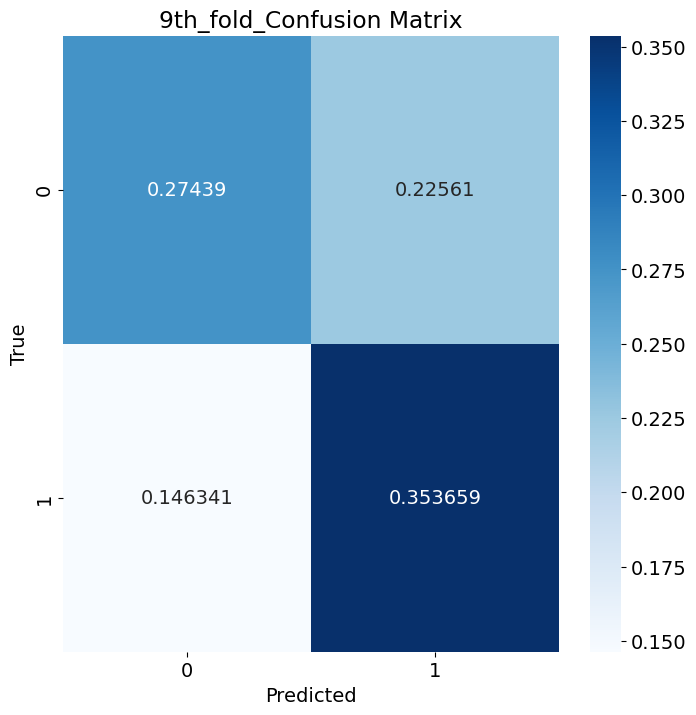

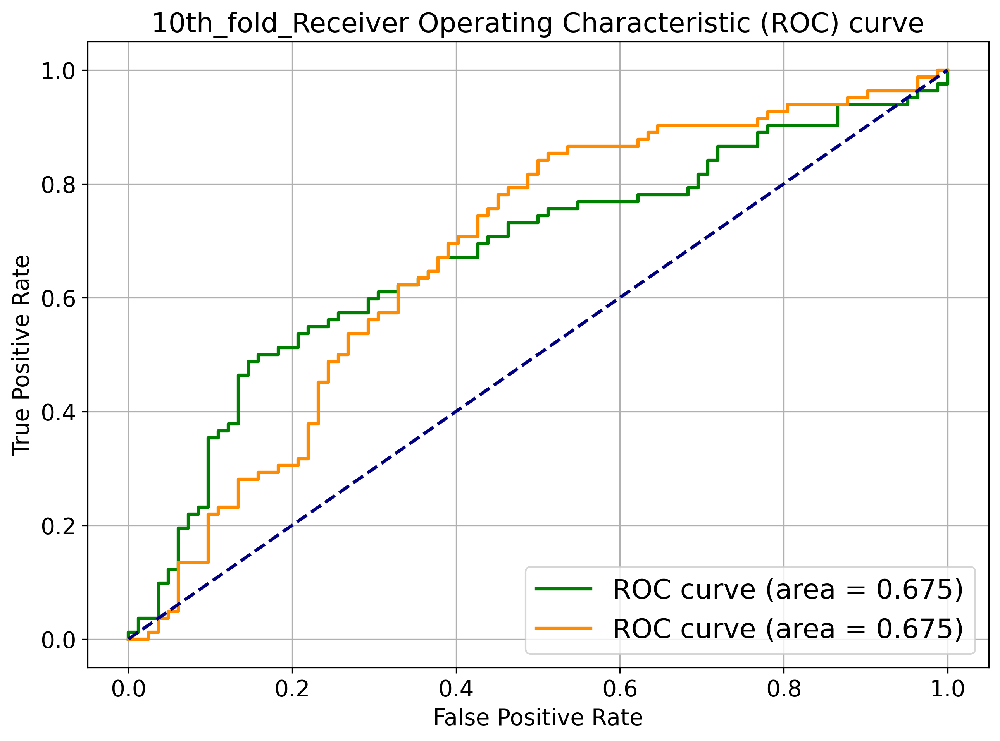

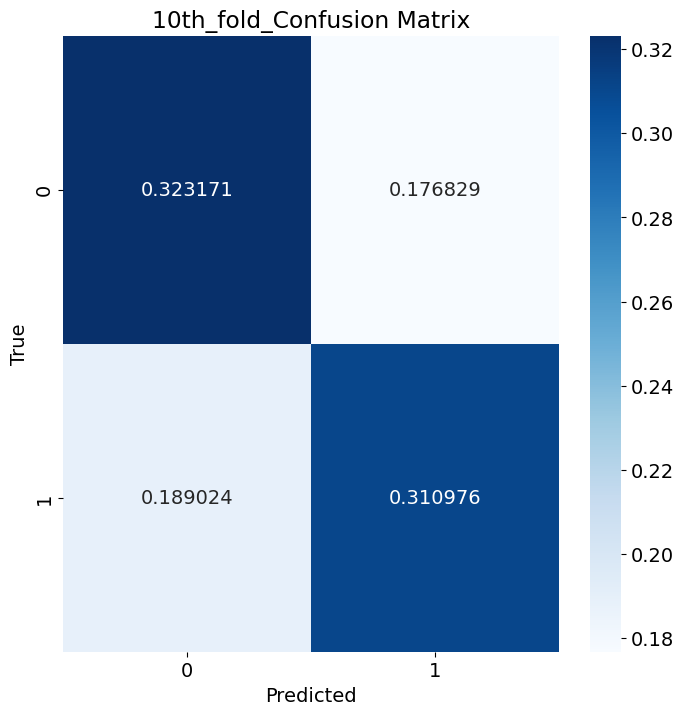

In [9]:
#Below results are for shuffle depth True

confusion_matrix_accumulator = np.zeros((2, 2))
cm1 = print_metrics(1,desc,149)
cm2 = print_metrics(2,desc,149)
cm3 = print_metrics(3,desc,149)
cm4 = print_metrics(4,desc,149)
cm5 = print_metrics(5,desc,149)
cm6 = print_metrics(6,desc,149)
cm7 = print_metrics(7,desc,149)
cm8 = print_metrics(8,desc,149)
cm9 = print_metrics(9,desc,149)
cm10 = print_metrics(10,desc,149)

# Below results are for the main TCN model

confusion_matrix_accumulator = np.zeros((2, 2))
cm1 = print_metrics(1,desc,36)
cm2 = print_metrics(2,desc,103)
cm3 = print_metrics(3,desc,29)
cm4 = print_metrics(4,desc,9)
cm5 = print_metrics(5,desc,4)
cm6 = print_metrics(6,desc,40)
cm7 = print_metrics(7,desc,43)
cm8 = print_metrics(8,desc,146)
cm9 = print_metrics(9,desc,51)
cm10 = print_metrics(10,desc,81)

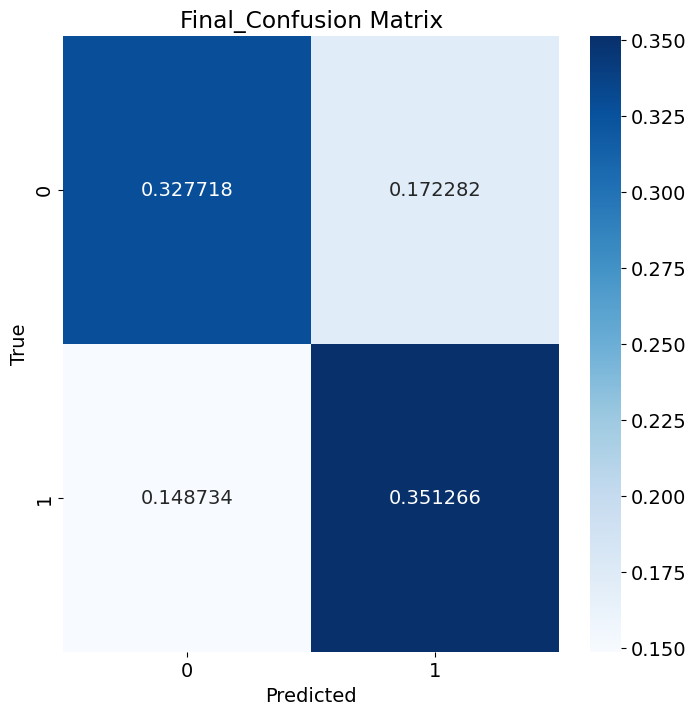

In [29]:
confusion_matrix_accumulator = cm1 + cm2 + cm3 + cm4 + cm5 + cm6 + cm7 + cm8 + cm9 + cm10
confusion_matrix_accumulator /= 10

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix_accumulator, annot=True, fmt='g', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title(f'Final_Confusion Matrix')
target_dir_path = Path(f"Output_Plots/{desc}/confusion_matrix")
target_dir_path.mkdir(parents=True, exist_ok=True)
plt.savefig(f'{target_dir_path}/average', dpi=300, bbox_inches='tight')

#Below results are for shuffle depth False

print_metrics(1,desc,36)
print_metrics(2,desc,103)
print_metrics(3,desc,29)
print_metrics(4,desc,9)
print_metrics(5,desc,4)
print_metrics(6,desc,40)
print_metrics(7,desc,43)
print_metrics(8,desc,146)
print_metrics(9,desc,51)
print_metrics(10,desc,81)

In [12]:
print_accuracies(desc, 1)

Epoch 0: Accuracy: 53.49%
Epoch 1: Accuracy: 56.98%
Epoch 2: Accuracy: 61.63%
Epoch 3: Accuracy: 60.47%
Epoch 4: Accuracy: 68.02%
Epoch 5: Accuracy: 60.47%
Epoch 6: Accuracy: 55.23%
Epoch 7: Accuracy: 61.63%
Epoch 8: Accuracy: 67.44%
Epoch 9: Accuracy: 67.44%
Epoch 10: Accuracy: 58.14%
Epoch 11: Accuracy: 66.86%
Epoch 12: Accuracy: 63.95%
Epoch 13: Accuracy: 66.86%
Epoch 14: Accuracy: 63.95%
Epoch 15: Accuracy: 66.86%
Epoch 16: Accuracy: 66.86%
Epoch 17: Accuracy: 68.02%
Epoch 18: Accuracy: 66.86%
Epoch 19: Accuracy: 68.02%
Epoch 20: Accuracy: 66.86%
Epoch 21: Accuracy: 66.86%
Epoch 22: Accuracy: 63.95%
Epoch 23: Accuracy: 66.86%
Epoch 24: Accuracy: 66.86%
Epoch 25: Accuracy: 67.44%
Epoch 26: Accuracy: 66.28%
Epoch 27: Accuracy: 66.86%
Epoch 28: Accuracy: 65.70%
Epoch 29: Accuracy: 66.28%
Epoch 30: Accuracy: 68.02%
Epoch 31: Accuracy: 66.86%
Epoch 32: Accuracy: 66.28%
Epoch 33: Accuracy: 68.02%
Epoch 34: Accuracy: 68.02%
Epoch 35: Accuracy: 67.44%
Epoch 36: Accuracy: 66.86%
Epoch 37: A

In [ ]:
for fold in folds:
    rb_and_plot_10_fold_accuracies(fold,desc)

In [ ]:
for fold in folds:
    rb_and_plot_10_fold_classification_losses(fold,desc)